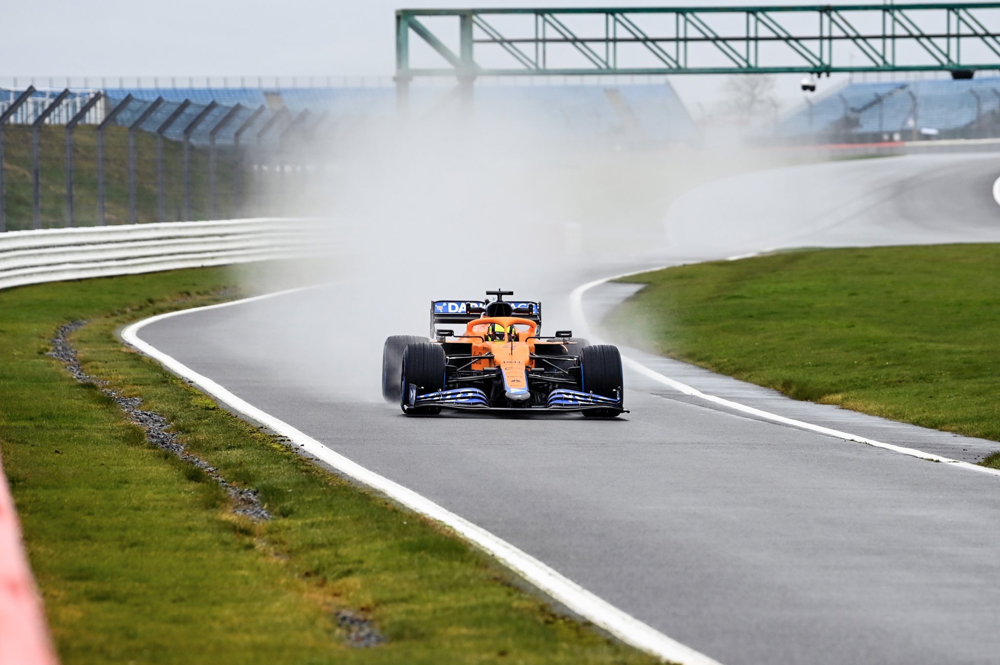

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

img_rgb  = cv2.imread('/content/lando-norris.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

cv2_imshow(img_rgb)

In [50]:
def rgb_to_hsv(img_rgb):
    img = img_rgb.astype(np.float32) / 255.0
    R, G, B = img[...,0], img[...,1], img[...,2]
    Cmax = np.max(img, axis=-1)
    Cmin = np.min(img, axis=-1)
    delta = Cmax - Cmin

    V = Cmax
    S = np.where(Cmax != 0, delta / Cmax, 0.0)
    H = np.zeros_like(V)
    mask = delta != 0

    m = mask & (Cmax == R); H[m] = 60.0 * (((G[m]-B[m])/delta[m]) % 6)
    m = mask & (Cmax == G); H[m] = 60.0 * ((B[m]-R[m])/delta[m] + 2)
    m = mask & (Cmax == B); H[m] = 60.0 * ((R[m]-G[m])/delta[m] + 4)
    return np.stack([H, S, V], axis=-1)

In [51]:
def rgb_to_hsl(img_rgb):
    img = img_rgb.astype(np.float32) / 255.0
    R, G, B = img[...,0], img[...,1], img[...,2]
    Cmax = np.max(img, axis=-1)
    Cmin = np.min(img, axis=-1)
    delta = Cmax - Cmin

    L = (Cmax + Cmin) / 2.0
    S = np.where(delta != 0, delta / (1 - np.abs(2*L - 1)), 0.0)
    H = np.zeros_like(L)
    mask = delta != 0

    m = mask & (Cmax == R); H[m] = 60.0 * (((G[m]-B[m])/delta[m]) % 6)
    m = mask & (Cmax == G); H[m] = 60.0 * ((B[m]-R[m])/delta[m] + 2)
    m = mask & (Cmax == B); H[m] = 60.0 * ((R[m]-G[m])/delta[m] + 4)
    return np.stack([H, S, L], axis=-1)

/tmp/ipykernel_1279/367486138.py:9: RuntimeWarning: invalid value encountered in divide
  S = np.where(Cmax != 0, delta / Cmax, 0.0)


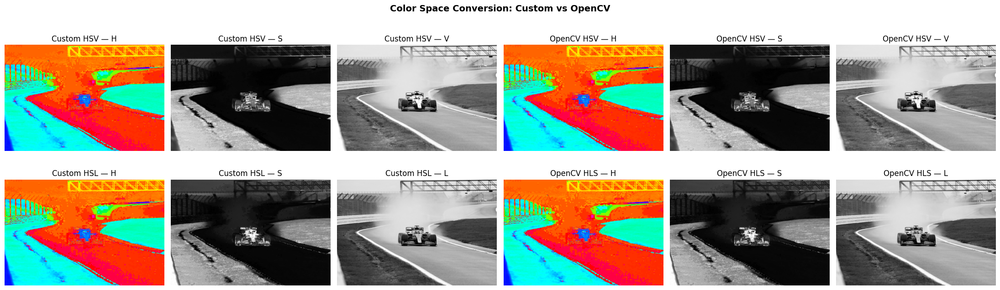

In [70]:
hsv_c = rgb_to_hsv(img_rgb)
hsl_c = rgb_to_hsl(img_rgb)

hsv_cv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
hsv_cv[...,0] *= 2; hsv_cv[...,1:] /= 255.0
hls_cv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HLS).astype(np.float32)
hls_cv[...,0] *= 2; hls_cv[...,1:] /= 255.0

fig, axes = plt.subplots(2, 6, figsize=(22, 7))
fig.suptitle('Color Space Conversion: Custom vs OpenCV', fontsize=14, fontweight='bold')

for i, (c, o, lbl) in enumerate(zip(
    [hsv_c[...,0], hsv_c[...,1], hsv_c[...,2]],
    [hsv_cv[...,0], hsv_cv[...,1], hsv_cv[...,2]],
    ['H','S','V'])):
    cmap = 'hsv' if lbl=='H' else 'gray'
    vmax = 360 if lbl=='H' else 1
    axes[0,i].imshow(c, cmap=cmap, vmin=0, vmax=vmax)
    axes[0,i].set_title(f'Custom HSV — {lbl}'); axes[0,i].axis('off')
    axes[0,i+3].imshow(o, cmap=cmap, vmin=0, vmax=vmax)
    axes[0,i+3].set_title(f'OpenCV HSV — {lbl}'); axes[0,i+3].axis('off')

for i, (c, o, lbl) in enumerate(zip(
    [hsl_c[...,0], hsl_c[...,1], hsl_c[...,2]],
    [hls_cv[...,0], hls_cv[...,2], hls_cv[...,1]],
    ['H','S','L'])):
    cmap = 'hsv' if lbl=='H' else 'gray'
    vmax = 360 if lbl=='H' else 1
    axes[1,i].imshow(c, cmap=cmap, vmin=0, vmax=vmax)
    axes[1,i].set_title(f'Custom HSL — {lbl}'); axes[1,i].axis('off')
    axes[1,i+3].imshow(o, cmap=cmap, vmin=0, vmax=vmax)
    axes[1,i+3].set_title(f'OpenCV HLS — {lbl}'); axes[1,i+3].axis('off')

plt.tight_layout()
plt.show()

In [52]:
def convolve2d(img, kernel):
    kh, kw = kernel.shape
    ph, pw = kh // 2, kw // 2
    padded = np.pad(img, ((ph,ph),(pw,pw)), mode='reflect')
    H, W = img.shape
    shape   = (H, W, kh, kw)
    strides = padded.strides[:2] + padded.strides[:2]
    from numpy.lib.stride_tricks import as_strided
    windows = as_strided(padded, shape=shape, strides=strides)
    return (windows * kernel).sum(axis=(-2,-1))

In [53]:
def apply_filter(img, kernel):
    if img.ndim == 2:
        return np.clip(convolve2d(img.astype(np.float64), kernel), 0, 255).astype(np.uint8)
    return np.stack([
        np.clip(convolve2d(img[...,c].astype(np.float64), kernel), 0, 255)
        for c in range(img.shape[2])
    ], axis=-1).astype(np.uint8)

In [54]:
def gaussian_kernel_2d(sigma, size):
    if size % 2 == 0: size += 1
    half = size // 2
    x = np.arange(-half, half+1)
    k1 = np.exp(-x**2 / (2*sigma**2))
    k1 /= k1.sum()
    kernel = np.outer(k1, k1)
    kernel /= kernel.sum()
    return kernel

In [55]:
def blend_images(img1, img2, alpha, beta, gamma):
    out = alpha*img1.astype(np.float64) + beta*img2.astype(np.float64) + gamma
    return np.clip(out, 0, 255).astype(np.uint8)

In [56]:
img2 = np.fliplr(img_rgb)
img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

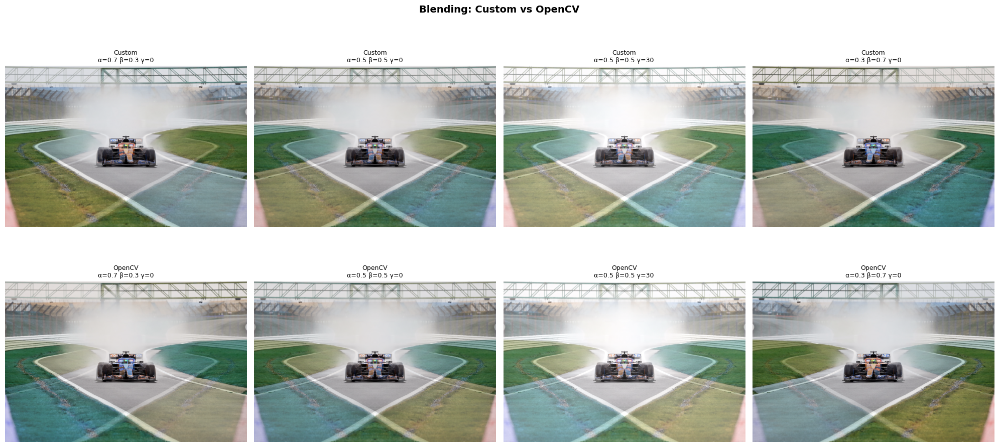

In [69]:
params = [
    (0.7, 0.3, 0,  'α=0.7 β=0.3 γ=0'),
    (0.5, 0.5, 0,  'α=0.5 β=0.5 γ=0'),
    (0.5, 0.5, 30, 'α=0.5 β=0.5 γ=30'),
    (0.3, 0.7, 0,  'α=0.3 β=0.7 γ=0'),
]

fig, axes = plt.subplots(2, 4, figsize=(20,10))
fig.suptitle('Blending: Custom vs OpenCV', fontsize=14, fontweight='bold')

for i, (a, b, g, lbl) in enumerate(params):
    cust = blend_images(img_bgr, img2, a, b, g)
    ocv  = cv2.cvtColor(cv2.addWeighted(img_bgr, a, img2, b, g), cv2.COLOR_BGR2RGB)
    axes[0,i].imshow(cust); axes[0,i].set_title(f'Custom\n{lbl}', fontsize=9); axes[0,i].axis('off')
    axes[1,i].imshow(ocv);  axes[1,i].set_title(f'OpenCV\n{lbl}', fontsize=9); axes[1,i].axis('off')

plt.tight_layout()
plt.show()

In [58]:
def threshold_binary(g, t, mv=255):     return np.where(g>=t, mv, 0).astype(np.uint8)
def threshold_binary_inv(g, t, mv=255): return np.where(g<t, mv, 0).astype(np.uint8)
def threshold_tozero(g, t):             return np.where(g>=t, g, 0).astype(np.uint8)
def threshold_tozero_inv(g, t):         return np.where(g<t, g, 0).astype(np.uint8)
def threshold_trunc(g, t):              return np.where(g>t, t, g).astype(np.uint8)


In [59]:
def adaptive_threshold_gaussian(img_gray, block_size=11, C=2, maxval=255):
    if block_size % 2 == 0: block_size += 1
    sigma = 0.3 * ((block_size-1)*0.5 - 1) + 0.8
    kernel = gaussian_kernel_2d(sigma, block_size)
    mean = convolve2d(img_gray.astype(np.float64), kernel)
    return np.where(img_gray.astype(np.float64) > mean - C, maxval, 0).astype(np.uint8)

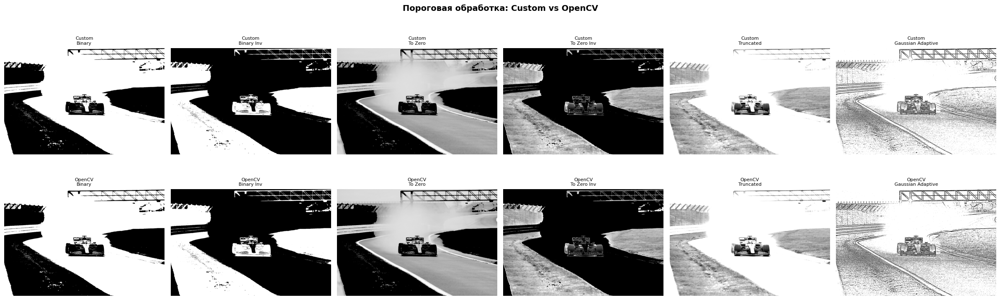

In [68]:
T = 127
custom_thresh = [
    threshold_binary(img_gray, T),
    threshold_binary_inv(img_gray, T),
    threshold_tozero(img_gray, T),
    threshold_tozero_inv(img_gray, T),
    threshold_trunc(img_gray, T),
    adaptive_threshold_gaussian(img_gray, 11, 2),
]
cv_thresh = [
    cv2.threshold(img_gray, T, 255, cv2.THRESH_BINARY)[1],
    cv2.threshold(img_gray, T, 255, cv2.THRESH_BINARY_INV)[1],
    cv2.threshold(img_gray, T, 255, cv2.THRESH_TOZERO)[1],
    cv2.threshold(img_gray, T, 255, cv2.THRESH_TOZERO_INV)[1],
    cv2.threshold(img_gray, T, 255, cv2.THRESH_TRUNC)[1],
    cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                          cv2.THRESH_BINARY, 11, 2),
]
labels_thr = ['Binary','Binary Inv','To Zero','To Zero Inv','Truncated','Gaussian Adaptive']

fig, axes = plt.subplots(2, 6, figsize=(24, 8))
fig.suptitle('Пороговая обработка: Custom vs OpenCV', fontsize=14, fontweight='bold')
for i, (c, o, lbl) in enumerate(zip(custom_thresh, cv_thresh, labels_thr)):
    axes[0,i].imshow(c, cmap='gray'); axes[0,i].set_title(f'Custom\n{lbl}', fontsize=8); axes[0,i].axis('off')
    axes[1,i].imshow(o, cmap='gray'); axes[1,i].set_title(f'OpenCV\n{lbl}', fontsize=8); axes[1,i].axis('off')
plt.tight_layout()
plt.show()

In [61]:
def median_blur(img, ksize=3):
    assert ksize % 2 == 1
    pad = ksize // 2
    if img.ndim == 2:
        from numpy.lib.stride_tricks import as_strided
        padded = np.pad(img, pad, mode='reflect').astype(np.float64)
        H, W = img.shape
        shape   = (H, W, ksize, ksize)
        strides = padded.strides[:2] + padded.strides[:2]
        windows = as_strided(padded, shape=shape, strides=strides)
        return np.median(windows, axis=(-2,-1)).astype(np.uint8)
    return np.stack([median_blur(img[...,c], ksize) for c in range(img.shape[2])], axis=-1)


In [62]:
def gaussian_blur(img, ksize=5, sigma=1.0):
    kernel = gaussian_kernel_2d(sigma, ksize)
    return apply_filter(img, kernel)

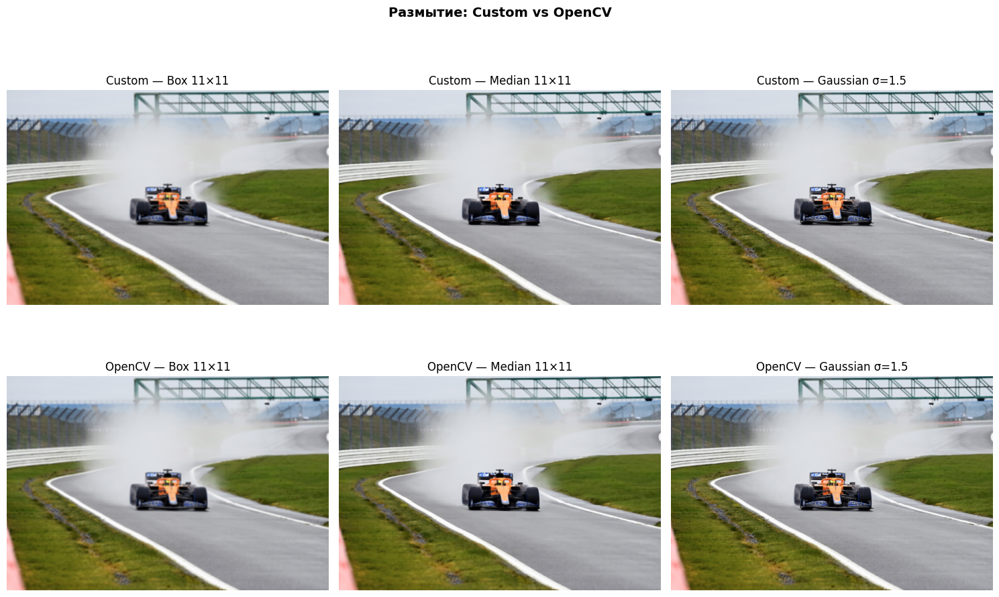

In [77]:
box_k = np.ones((11,11), np.float64) / 121.0

r_box_c    = apply_filter(img_bgr, box_k)
r_med_c    = median_blur(img_bgr, 11)
r_gauss_c  = gaussian_blur(img_bgr, 11, 1.5)

r_box_cv   = cv2.cvtColor(cv2.blur(img_rgb,(11,11)), cv2.COLOR_BGR2RGB)
r_med_cv   = cv2.cvtColor(cv2.medianBlur(img_rgb,11), cv2.COLOR_BGR2RGB)
r_gauss_cv = cv2.cvtColor(cv2.GaussianBlur(img_rgb,(11,11),1.5), cv2.COLOR_BGR2RGB)

blur_results = [
    (r_box_c,   r_box_cv,   'Box 11×11'),
    (r_med_c,   r_med_cv,   'Median 11×11'),
    (r_gauss_c, r_gauss_cv, 'Gaussian σ=1.5'),
]

fig, axes = plt.subplots(2, 3, figsize=(15,10))
fig.suptitle('Размытие: Custom vs OpenCV', fontsize=14, fontweight='bold')
for i, (c, o, lbl) in enumerate(blur_results):
    axes[0,i].imshow(c); axes[0,i].set_title(f'Custom — {lbl}'); axes[0,i].axis('off')
    axes[1,i].imshow(o); axes[1,i].set_title(f'OpenCV — {lbl}'); axes[1,i].axis('off')
plt.tight_layout()
plt.show()

In [72]:
def sobel_filter(img_gray):
    Kx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], np.float64)
    Ky = np.array([[-1,-2,-1],[0,0,0],[1,2,1]],  np.float64)
    Gx = convolve2d(img_gray.astype(np.float64), Kx)
    Gy = convolve2d(img_gray.astype(np.float64), Ky)
    mag = np.sqrt(Gx**2 + Gy**2)
    direction = np.arctan2(Gy, Gx) * 180 / np.pi
    return Gx, Gy, mag, direction

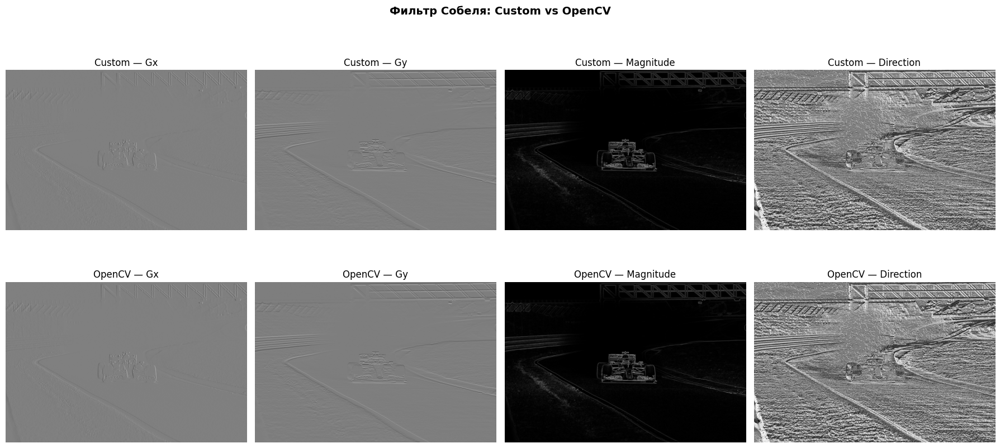

In [85]:
Gx, Gy, mag, direction = sobel_filter(img_gray)
cv_Gx  = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
cv_Gy  = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
cv_mag = np.sqrt(cv_Gx**2 + cv_Gy**2)
cv_dir = np.arctan2(cv_Gy, cv_Gx) * 180 / np.pi

def norm_d(a): return ((a - a.min()) / (a.max() - a.min() + 1e-8) * 255).astype(np.uint8)

custom_imgs = [norm_d(Gx),    norm_d(Gy),    norm_d(mag),    norm_d(direction)]
opencv_imgs = [norm_d(cv_Gx), norm_d(cv_Gy), norm_d(cv_mag), norm_d(cv_dir)]
titles      = ['Gx', 'Gy', 'Magnitude', 'Direction']

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
fig.suptitle('Фильтр Собеля: Custom vs OpenCV', fontsize=14, fontweight='bold')

for i, (c, o, t) in enumerate(zip(custom_imgs, opencv_imgs, titles)):
    axes[0, i].imshow(c, cmap='gray')
    axes[0, i].set_title(f'Custom — {t}')
    axes[0, i].axis('off')
    axes[1, i].imshow(o, cmap='gray')
    axes[1, i].set_title(f'OpenCV — {t}')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [80]:
def histogram_equalization(img_gray):
    hist = np.zeros(256, dtype=np.int64)
    for v in img_gray.ravel():
        hist[v] += 1
    cdf = hist.cumsum()
    cdf_min = cdf[cdf > 0].min()
    N = img_gray.size
    lut = np.round((cdf - cdf_min) / (N - cdf_min) * 255).clip(0,255).astype(np.uint8)
    return lut[img_gray], hist, cdf

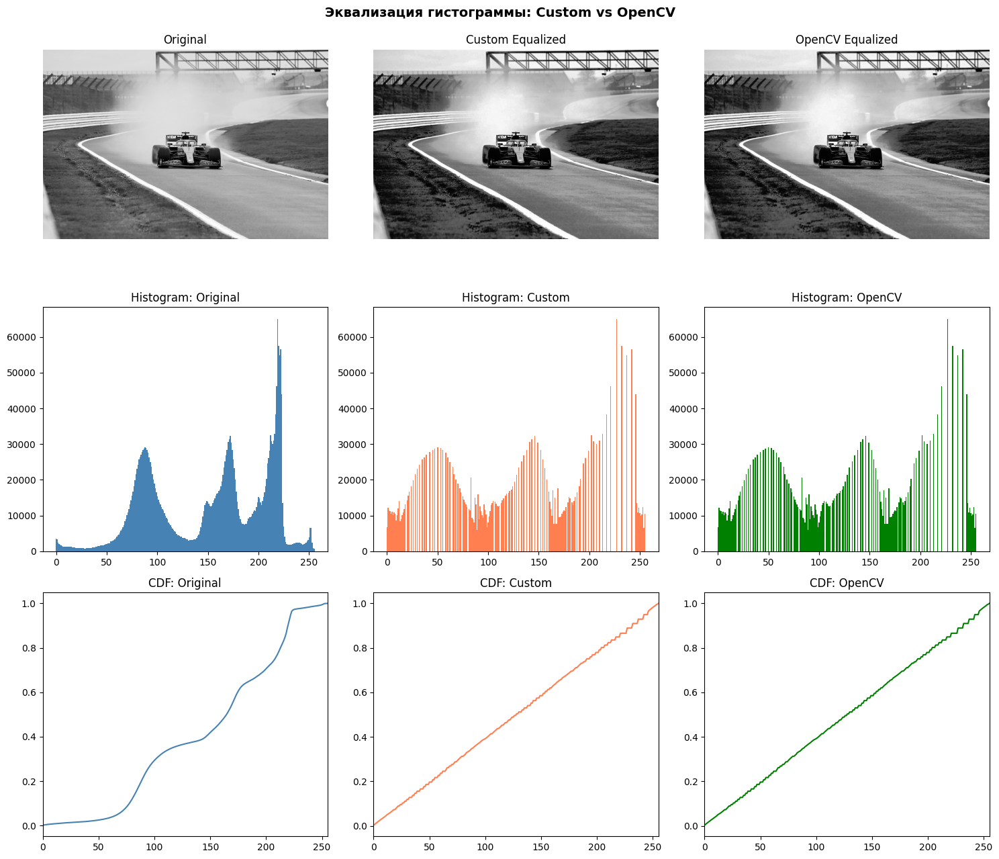

In [83]:
eq_c, hist_orig, cdf_orig = histogram_equalization(img_gray)
eq_cv = cv2.equalizeHist(img_gray)

h_eq_c,  _ = np.histogram(eq_c.ravel(),  256, (0,256))
h_eq_cv, _ = np.histogram(eq_cv.ravel(), 256, (0,256))

fig, axes = plt.subplots(3, 3, figsize=(15,13))
fig.suptitle('Эквализация гистограммы: Custom vs OpenCV', fontsize=14, fontweight='bold')

axes[0,0].imshow(img_gray, cmap='gray'); axes[0,0].set_title('Original'); axes[0,0].axis('off')
axes[0,1].imshow(eq_c, cmap='gray');    axes[0,1].set_title('Custom Equalized'); axes[0,1].axis('off')
axes[0,2].imshow(eq_cv, cmap='gray');   axes[0,2].set_title('OpenCV Equalized'); axes[0,2].axis('off')

axes[1,0].bar(range(256), hist_orig, width=1, color='steelblue'); axes[1,0].set_title('Histogram: Original')
axes[1,1].bar(range(256), h_eq_c,   width=1, color='coral');     axes[1,1].set_title('Histogram: Custom')
axes[1,2].bar(range(256), h_eq_cv,  width=1, color='green');     axes[1,2].set_title('Histogram: OpenCV')

cdf_n   = cdf_orig / cdf_orig.max()
cdf_c_n = np.cumsum(h_eq_c).astype(np.float64);  cdf_c_n  /= cdf_c_n.max()
cdf_v_n = np.cumsum(h_eq_cv).astype(np.float64); cdf_v_n  /= cdf_v_n.max()

axes[2,0].plot(cdf_n,   color='steelblue'); axes[2,0].set_title('CDF: Original')
axes[2,1].plot(cdf_c_n, color='coral');     axes[2,1].set_title('CDF: Custom')
axes[2,2].plot(cdf_v_n, color='green');     axes[2,2].set_title('CDF: OpenCV')
for ax in axes[2]: ax.set_xlim(0,255)

plt.tight_layout()
plt.show()